## Trained with Fast.ai library - failed sample

This example shows how training have failed and why.

Basically used the same VGG16 as model.

But by interpreting cats&dog tutorial naively, this trained all the weight of the model.

- differential learning rates: `lrs = np.array([1e-4]*20 + [1e-3]*20 + [1e-2] *9)`

### What failed?

Validation loss looks like good, but it was not generalized well to capture book picture properly.

### What have caused issue?

Allowed training early layers of pretrained model, *might have* broken good feature representation generalized by training ImageNet.

This assumption is supported by following attempt have succeeded which keeps early layers frozen, and train only later layers which normally we do for transfer learning.

In [1]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
np.warnings.filterwarnings('ignore')
np.random.seed(1001)

import os
import sys
import shutil
from pathlib import Path

import IPython
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

matplotlib.style.use('ggplot')
%matplotlib inline

from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

In [2]:
folder = 'work_fastai'
PATH = Path('./dataset')
sz = 224
arch = vgg16
bs = 16

In [3]:
print(torch.cuda.is_available(), torch.backends.cudnn.enabled)

True True


In [4]:
# Make data files csv
train_files = list(PATH.glob('train/*/*.jpg'))
y_train     = [f.parent for f in train_files]
train_files = [f.parent.name+'/'+f.name for f in train_files]
df = pd.DataFrame()
df['fnames'] = train_files
df['target'] = y_train
df.to_csv(PATH/'labels.csv', index=False)

In [5]:
from sklearn.model_selection import train_test_split
_, val_idxs, _, _ = train_test_split(list(range(len(train_files))), y_train, test_size=0.2, random_state=42)

In [6]:
tfms = tfms_from_model(arch, sz,
                       aug_tfms=transforms_side_on+[Cutout(n_holes=3, length=40), RandomBlur()],
                       max_zoom=1.5)
data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name='test',
                                   val_idxs=val_idxs, tfms=tfms, bs=bs)
classes = [Path(c).name for c in data.classes]

In [22]:
model = nn.Sequential(*children(arch(pre=True))[:-2],
                      nn.Dropout2d(0.05),
                      nn.Conv2d(512, len(data.classes), 3, padding=1), 
                      nn.Dropout2d(0.1),
                      nn.AdaptiveAvgPool2d(1), Flatten(), 
                      nn.Dropout2d(0.3),
                      nn.LogSoftmax())

learn = ConvLearner.from_model_data(model, data)

# skip learn.lr_find() due to data size too small

In [23]:
lrs = np.array([1e-4]*20 + [1e-3]*20 + [1e-2] *9)
learn.fit(lrs[-1], 5)

epoch      trn_loss   val_loss   accuracy                
    0      3.251056   3.055864   0.133333  
    1      3.898892   4.593628   0.533333                
    2      3.508203   2.755729   0.466667                
    3      3.624461   1.2086     0.6                     
    4      3.713222   25.849689  0.4                     



[25.849689483642578, 0.4000000059604645]

In [24]:
learn.unfreeze()
learn.fit(lrs, n_cycle=3, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss   accuracy                
    0      3.646322   10.820341  0.4       
    1      3.474086   3.11239    0.533333                
    2      2.875313   2.019985   0.533333                
    3      2.718095   1.116999   0.533333                
    4      2.333043   0.397223   0.866667                
    5      2.079765   0.280324   1.0                     
    6      1.889499   0.269034   1.0                     



[0.26903411746025085, 1.0]

In [25]:
test_expected_preds = np.array([
    [0, 1, 0, 0, 0, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 1, 0],
    [0, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 1],
])
test_difficult_expected_preds = np.array([
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.2, 0.2, 0.2, 0.2, 0.2],
    [0, 0.1, 0.0, 0.4, 0.4, 0.1],
    [0, 0.7, 0.0, 0.2, 0.1, 0.1],
    [0, 0.1, 0.0, 0.1, 0.1, 0.7], # 5495
    [0.8, 0, 0, 0, 0, 0.2],
    [0, 0, 1, 0, 0, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.1, 0, 0, 0, 0.9],
    [0, 0.3, 0, 0.2, 0.2, 0.4], # 5500
    [0, 0.1, 0, 0.1, 0.7, 0.1],
    [0, 0.1, 0, 0.8, 0.1, 0],
    [0, 0.0, 0, 0.8, 0.2, 0],
    [0, 0, 1, 0, 0, 0],
    [0, 0.8, 0.2, 0, 0, 0], # 5506
    [0, 0.6, 0, 0.4, 0, 0],
    [0, 0.2, 0, 0.6, 0.2, 0],
    [0, 0, 0, 0.2, 0.7, 0.1],
    [0, 0, 0, 0, 0.4, 0.6]
])
import PIL
def calc_soft_acc(expected, pred):
    pred_idx = np.argmax(pred)
    return 1 if expected[pred_idx] >= 0.2 else 0

def tta_log_preds_to_probs(log_preds):
    probs = np.exp(log_preds)
    if len(log_preds.shape) == 3: # TTA to get mean
        print('TTA for {} preds.'.format(log_preds.shape[0]))
        probs = np.mean(probs, axis=0)
    return probs

def evaluate_test_fastai(learn, test_datapath, expected_preds, show_detail=True):
    data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name=test_datapath,
                                   val_idxs=val_idxs, tfms=tfms, bs=1)
    log_preds = learn.predict_dl(data.test_dl) #learn.TTA(is_test=True) not used to compare with others
    preds = tta_log_preds_to_probs(log_preds)
    results = np.argmax(preds, axis=1)
    # sort by filename - test_dl is not sorted
    sorted_vars = sorted([(fn, p, r) for fn, p, r in zip(data.test_ds.fnames, preds, results)], key=lambda x:x[0])
    fnames  = [v[0] for v in sorted_vars]
    preds   = np.array([v[1] for v in sorted_vars])
    results = np.array([v[2] for v in sorted_vars])
    # calculate metric, by special soft accuracy
    references = np.argmax(expected_preds, axis=-1)
    #accuracy = np.sum(results == references) / len(preds)
    accuracy = np.sum([calc_soft_acc(expected, pred)
                        for expected, pred in zip(expected_preds, preds)])\
                       / len(preds)
    print('accuracy = ', accuracy)
    #score_all = np.sum(preds * expected_preds) / len(preds)
    #print('prediction score =', score_all)
    if show_detail:
        for no, (fname, result, ref, pred) in enumerate(zip(fnames, results, references, preds)):
            plt.imshow(PIL.Image.open(PATH/fname))
            plt.axis('off')
            print(fname)
            plt.title('#%d %s? %s %s' % (no, classes[result], 'yes' if result == ref else 'no',
                                         str({classes[i]:pred[i] for i in range(len(pred))})))
            plt.show()
    return accuracy

accuracy =  1.0
test/img_1873.jpg


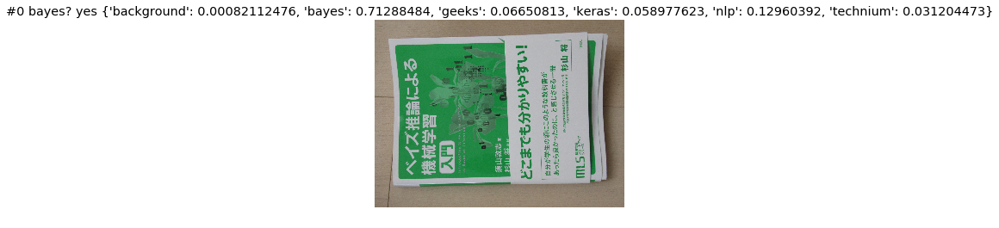

test/img_1874.jpg


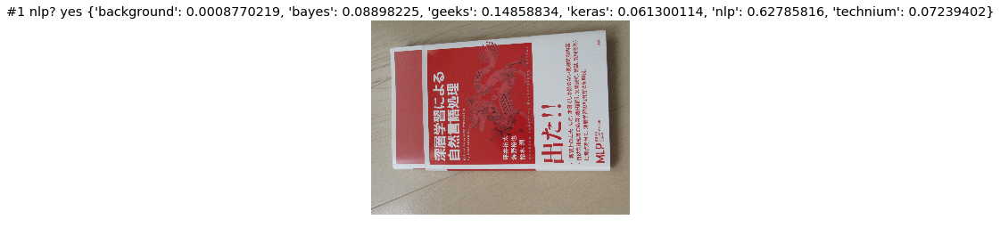

test/img_1875.jpg


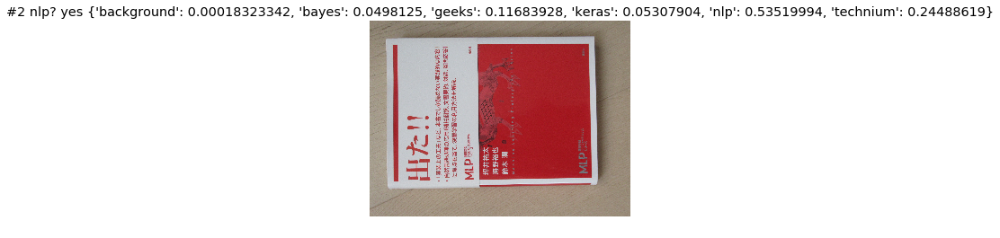

test/img_1876.jpg


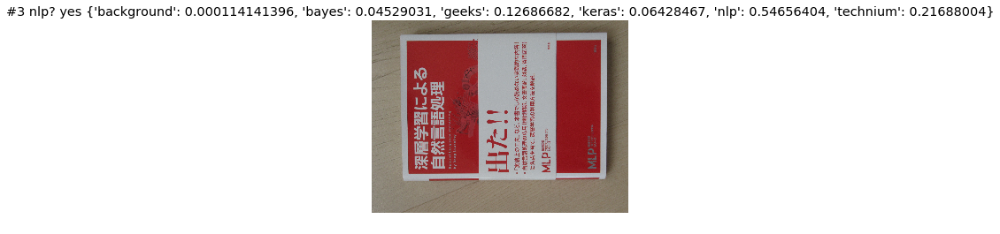

test/img_1877.jpg


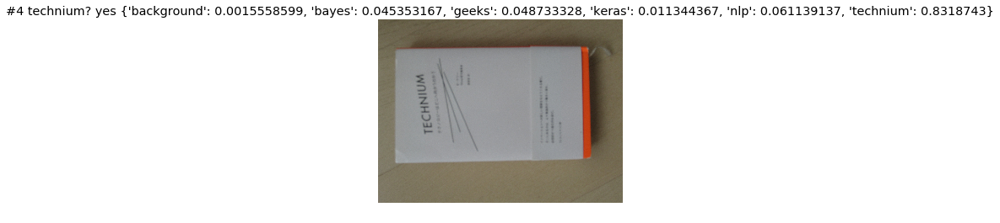

test/img_1878.jpg


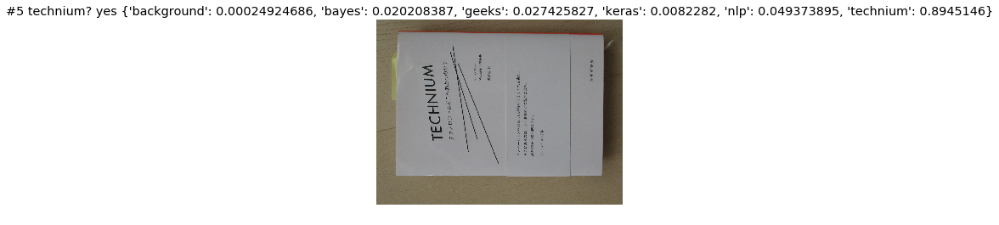

1.0

In [26]:
evaluate_test_fastai(learn, 'test', test_expected_preds, show_detail=True)

accuracy =  0.25
test_difficult/img_5490.jpg


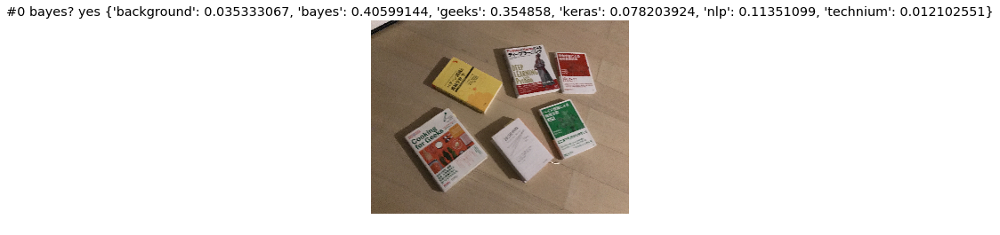

test_difficult/img_5491.jpg


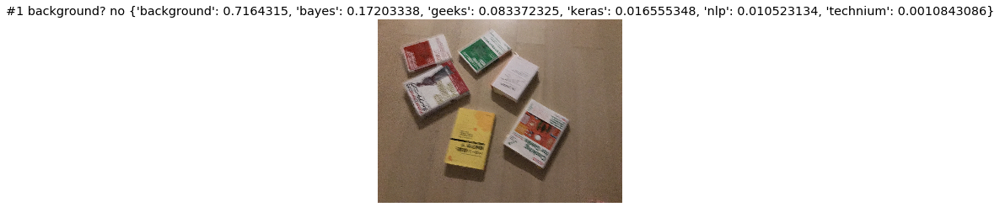

test_difficult/img_5492.jpg


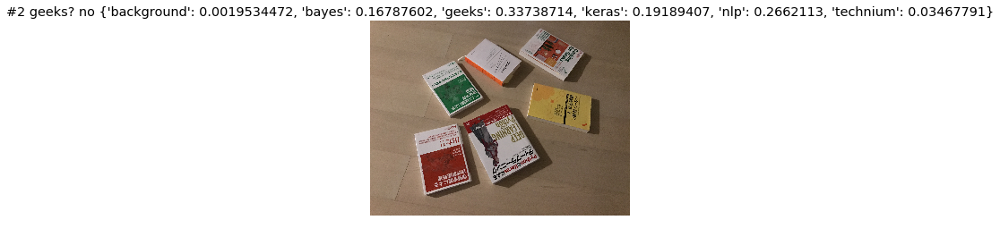

test_difficult/img_5493.jpg


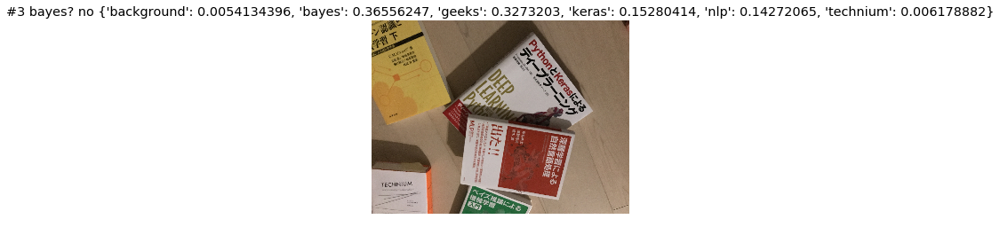

test_difficult/img_5494.jpg


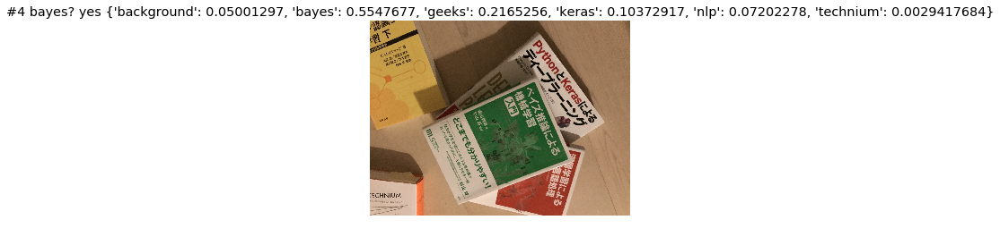

test_difficult/img_5495.jpg


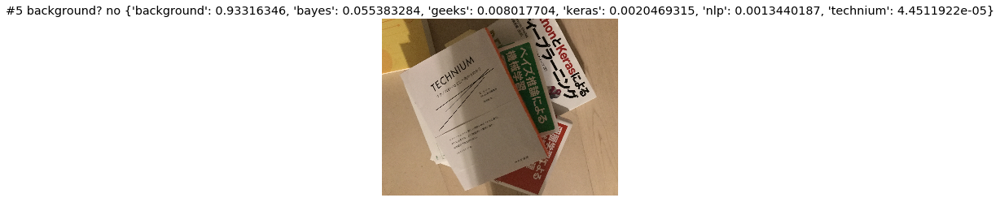

test_difficult/img_5496.jpg


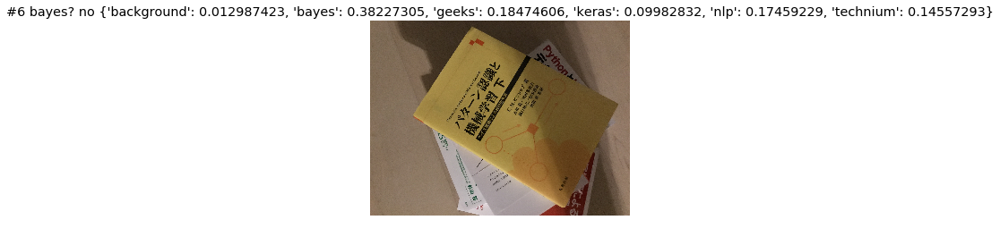

test_difficult/img_5497.jpg


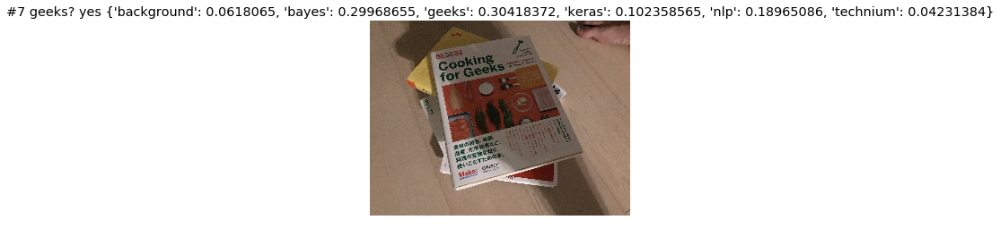

test_difficult/img_5498.jpg


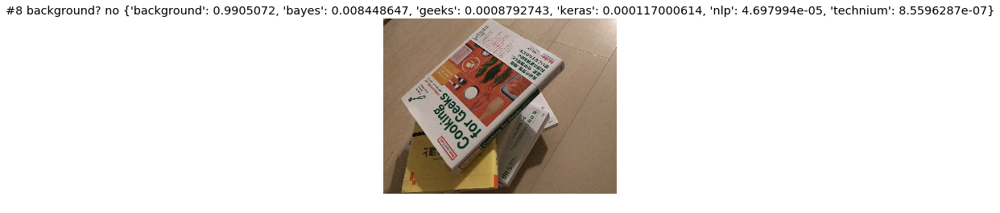

test_difficult/img_5499.jpg


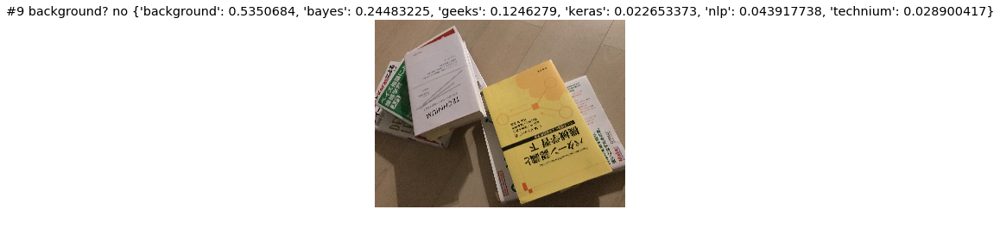

test_difficult/img_5500.jpg


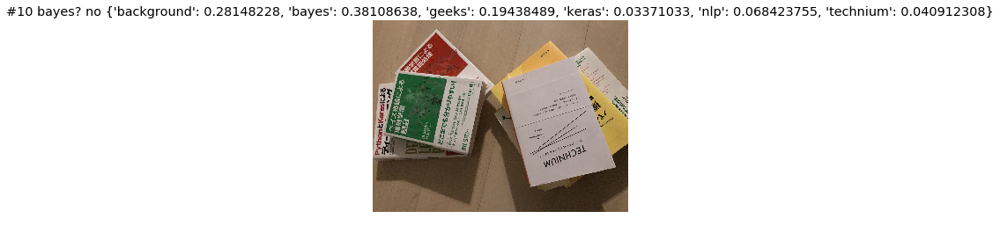

test_difficult/img_5502.jpg


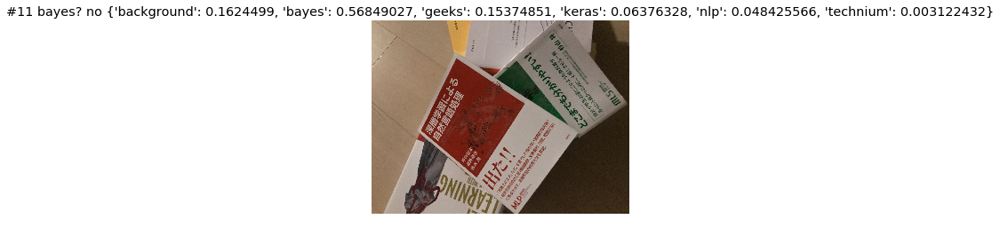

test_difficult/img_5503.jpg


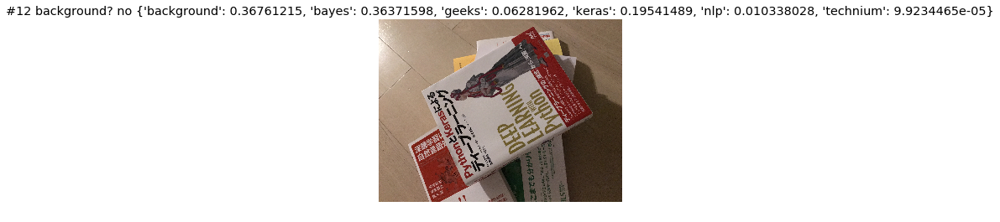

test_difficult/img_5504.jpg


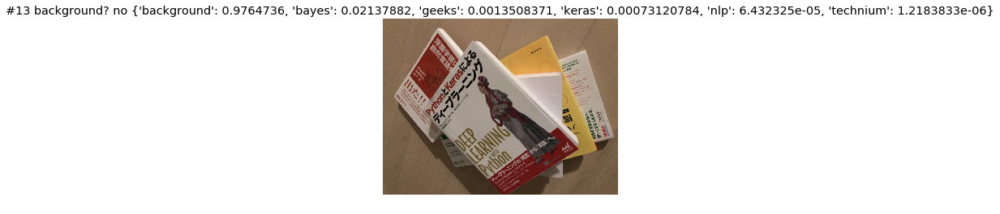

test_difficult/img_5505.jpg


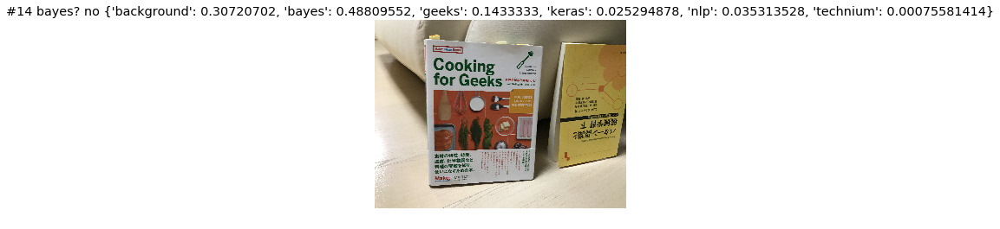

test_difficult/img_5506.jpg


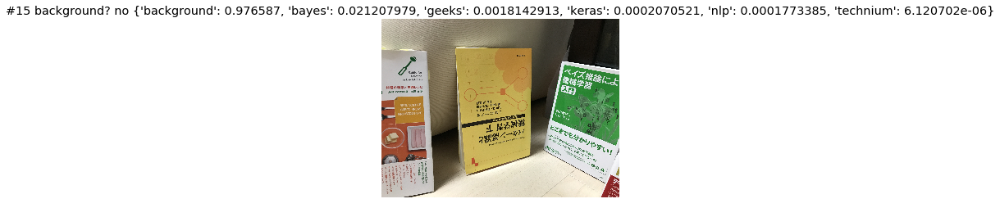

test_difficult/img_5507.jpg


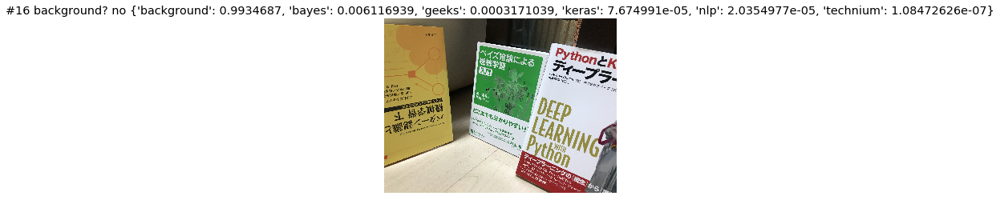

test_difficult/img_5508.jpg


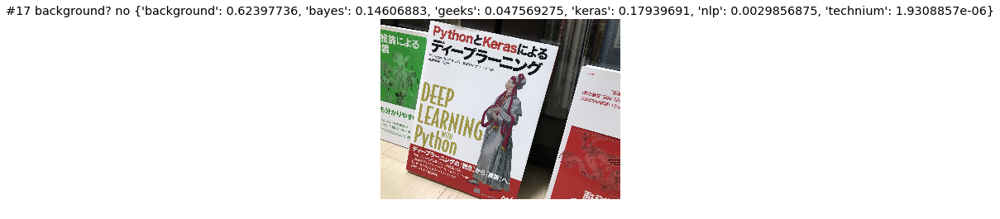

test_difficult/img_5509.jpg


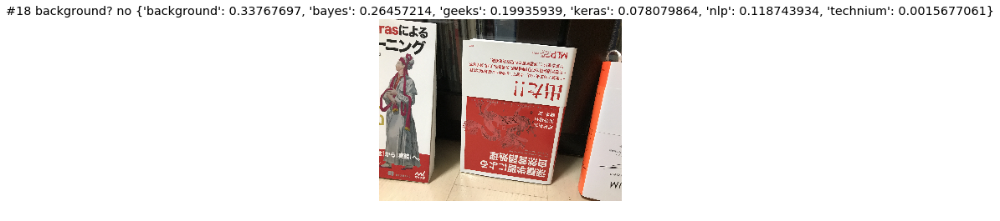

test_difficult/img_5510.jpg


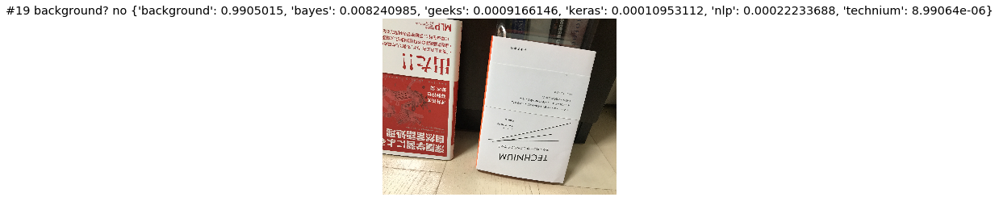

0.25

In [27]:
evaluate_test_fastai(learn, 'test_difficult', test_difficult_expected_preds, show_detail=True)

## Visualization

In [28]:
learn.save('weight')

In [29]:
m = learn.model
m

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace)
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU(inplace)
  (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU(inplace)
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): BatchNor

In [30]:
class SaveFeatures():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

In [31]:
data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name='test_difficult',
                                   val_idxs=val_idxs, tfms=tfms, bs=20)
xx, yy = next(iter(data.test_dl))

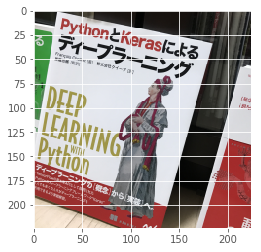

In [32]:
targ = 19
x, y = xx[None, targ], yy[None, targ]
vx = Variable(x.cuda(), requires_grad=True)

dx = data.test_ds.denorm(x)[0]
plt.imshow(dx);

In [33]:
last_conv = -6
sfs = [SaveFeatures(o) for o in [m[last_conv-9], m[last_conv-6], m[last_conv-3], m[last_conv]]]
%time py = m(Variable(x.cuda()))
for o in sfs: o.remove()
print([o.features.size() for o in sfs])
py = np.exp(to_np(py)[0]); print(py)

CPU times: user 2.49 ms, sys: 0 ns, total: 2.49 ms
Wall time: 1.96 ms
[torch.Size([1, 512, 14, 14]), torch.Size([1, 512, 14, 14]), torch.Size([1, 512, 14, 14]), torch.Size([1, 6, 14, 14])]
[0.62398 0.14607 0.04757 0.1794  0.00299 0.     ]


In [34]:
feat = np.maximum(0,to_np(sfs[3].features[0]))
feat.shape

(6, 14, 14)

In [35]:
f2=np.dot(np.rollaxis(feat,0,3), py)
f2-=f2.min()
f2/=f2.max()
f2

array([[0.00957, 0.02504, 0.05188, 0.05702, 0.04988, 0.04503, 0.04664, 0.05128, 0.05123, 0.02759, 0.     ,
        0.11824, 0.35184, 0.284  ],
       [0.02433, 0.04859, 0.07155, 0.07358, 0.06075, 0.05769, 0.06836, 0.08353, 0.08611, 0.05857, 0.     ,
        0.15643, 0.56933, 0.50109],
       [0.036  , 0.04334, 0.03542, 0.01868, 0.00207, 0.00701, 0.03686, 0.07922, 0.10049, 0.07589, 0.00497,
        0.     , 0.34706, 0.34882],
       [0.02767, 0.02488, 0.     , 0.     , 0.     , 0.     , 0.     , 0.04388, 0.08211, 0.05671, 0.     ,
        0.     , 0.10962, 0.10539],
       [0.01069, 0.00176, 0.03316, 0.24163, 0.40642, 0.36524, 0.17769, 0.     , 0.02933, 0.     , 0.01791,
        0.059  , 0.     , 0.     ],
       [0.13501, 0.24138, 0.42972, 0.64671, 0.80946, 0.76801, 0.60662, 0.45009, 0.38662, 0.45315, 0.46364,
        0.21981, 0.     , 0.     ],
       [0.36737, 0.60508, 0.80094, 0.94348, 1.     , 0.89048, 0.72797, 0.62636, 0.63727, 0.71161, 0.6344 ,
        0.1999 , 0.     , 0.     ],

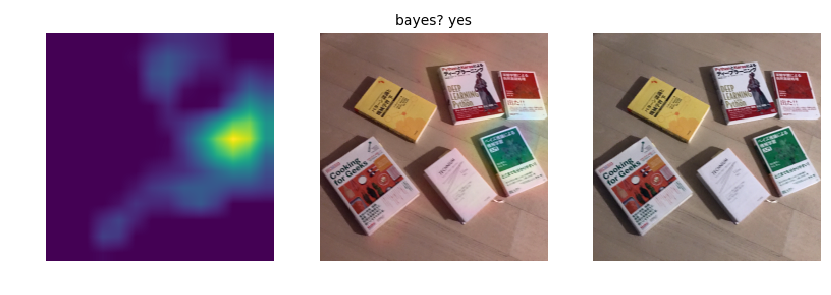

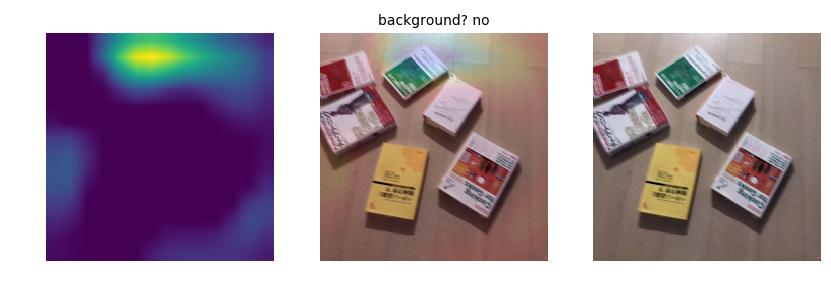

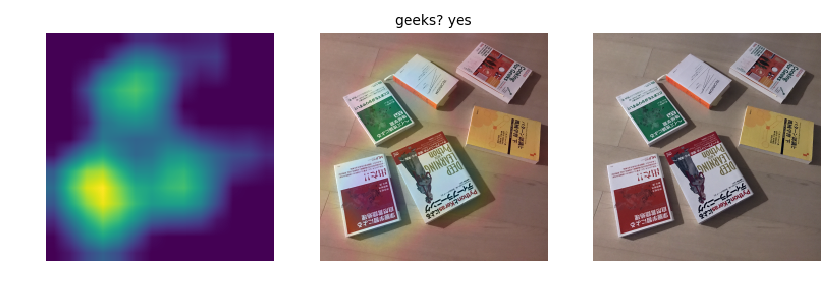

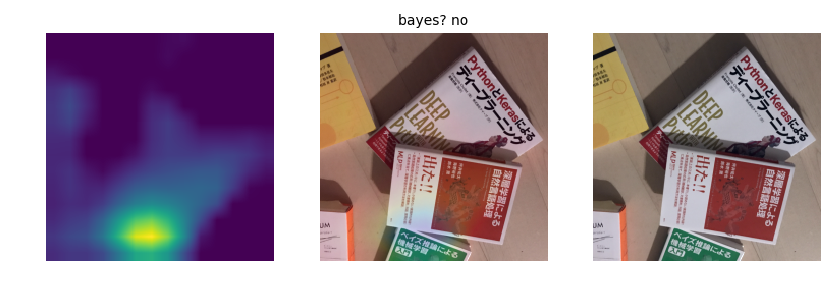

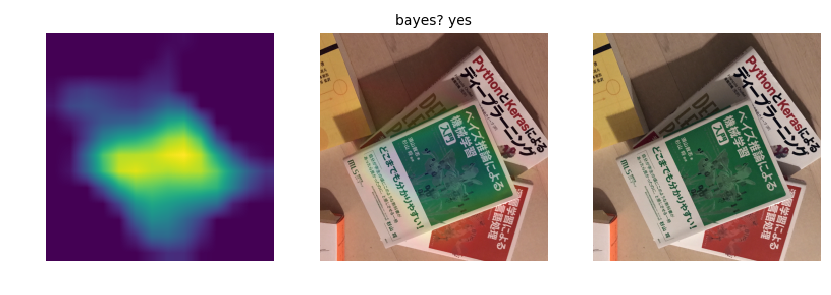

...

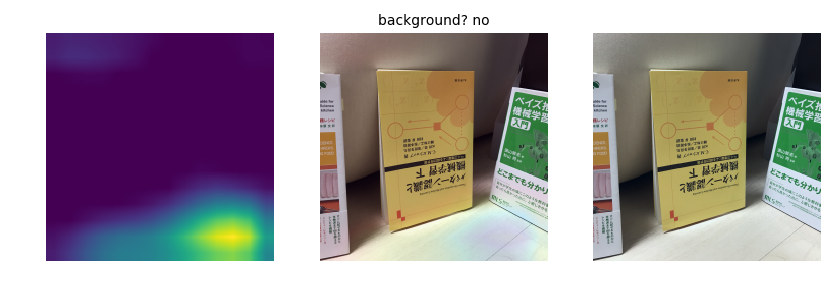

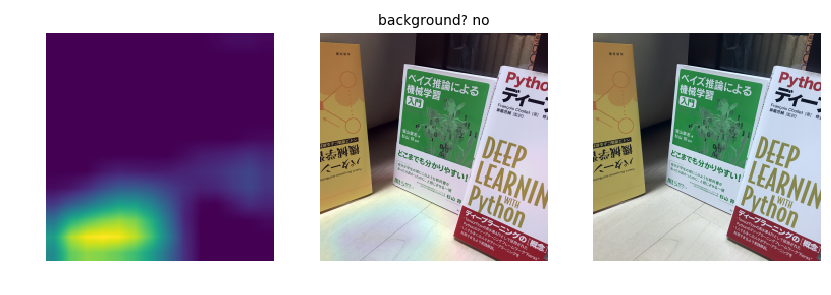

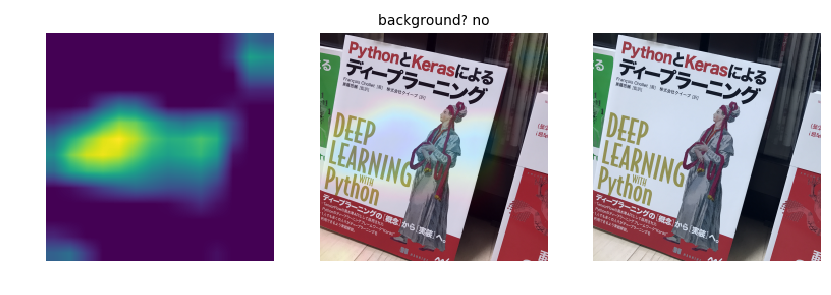

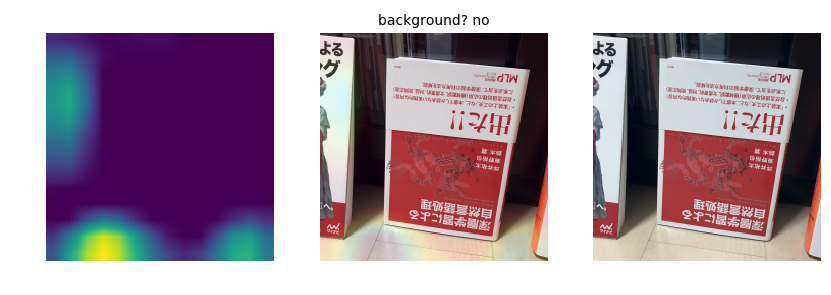

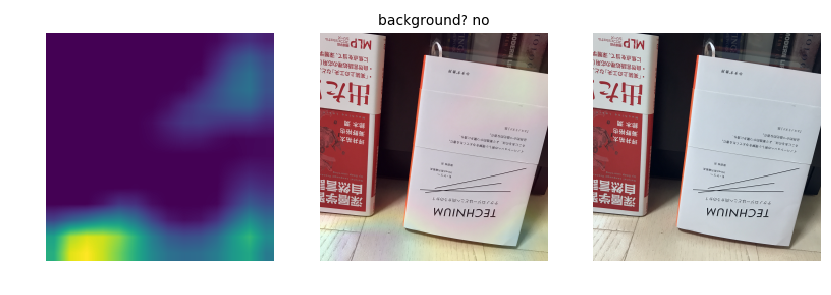

In [36]:
import cv2

class SaveFeatures():
    features=None
    def __init__(self, m): self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): self.features = output
    def remove(self): self.hook.remove()

def imshow_friendly(img):
    img_temp = img - np.min(img)
    img_temp = img_temp/np.max(img_temp)
    friendly = np.uint8(255 * img_temp)
    return friendly

data = ImageClassifierData.from_csv(PATH, 'train', PATH/'labels.csv', test_name='test_difficult',
                                    val_idxs=val_idxs, tfms=tfms, bs=20) #test_difficult has 20 images
xx, yy = next(iter(data.test_dl))
# sort
sorted_vars = sorted([(fn, x, y) for fn, x, y in zip(data.test_ds.fnames, to_np(xx), to_np(yy))], key=lambda x:x[0])
xx = np.array([v[1] for v in sorted_vars])
yy = np.array([v[2] for v in sorted_vars])

for test_file_index in range(20):
    x, y = xx[test_file_index, ...], yy[test_file_index, ...]
    x, y = x[np.newaxis, ...], y[np.newaxis, ...]
    last_conv = -6
    sfs = [SaveFeatures(o) for o in [m[last_conv-9], m[last_conv-6], m[last_conv-3], m[last_conv]]]
    py = m(Variable(torch.from_numpy(x).float().to("cuda:0")))
    for o in sfs: o.remove()
    py = np.exp(to_np(py)[0])
    targ_class = np.argmax(py)
    result = calc_soft_acc(test_difficult_expected_preds[test_file_index], py)

    feat = np.maximum(0, to_np(sfs[3].features[0]))
    f2 = np.rollaxis(feat, 0, 3)[..., targ_class]
    f2 -= f2.min()
    f2 /= f2.max()
    heatmap = f2

    img = np.rollaxis(to_np(x[0]), 0, 3)
    fig = plt.figure(figsize=(10, 5), dpi=100)
    ax = fig.add_subplot(131)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    ax.set_axis_off()
    ax.matshow(heatmap)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = ((heatmap*0.5/np.max(heatmap) + img)) / 1.5
    ax = fig.add_subplot(132)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(superimposed))
    ax.set_title('%s? %s' % (classes[targ_class], 'yes' if result == 1 else 'no'), fontsize=10)
    ax = fig.add_subplot(133)
    ax.set_axis_off()
    ax.imshow(imshow_friendly(img))
    fig.show()